In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
import os
import sys
import pandas as pd
sys.path.insert(0, os.path.join("../.."))

In [4]:
MAIN_FOLDER = os.path.join("../..")
IMG_FOLDER  = os.path.join(MAIN_FOLDER, "data", "train")

In [5]:
df = pd.read_csv(os.path.join(MAIN_FOLDER, "data", "train.csv"))

### Similiar images with different Pawpularity score

/home/ghias/miniconda3/envs/rapids-env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Comparing images: 100%|██████████| 9912/9912 [00:58<00:00, 169.50it/s] 



Found 27 duplicate pairs.



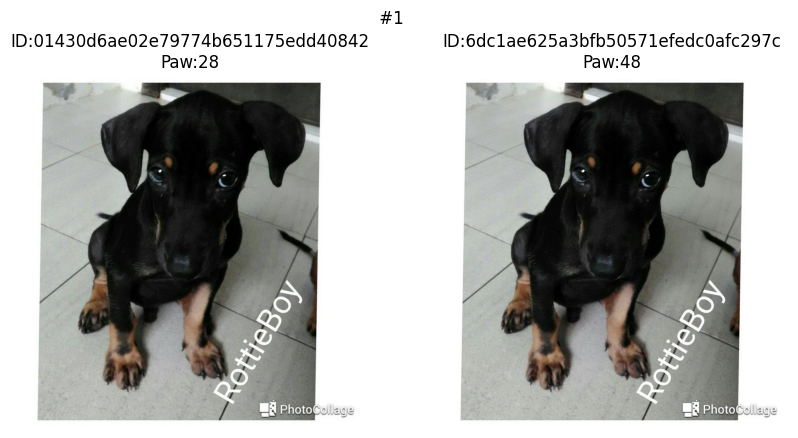

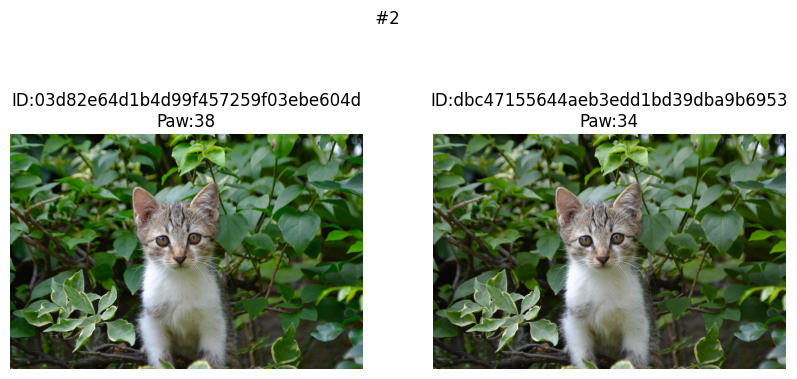

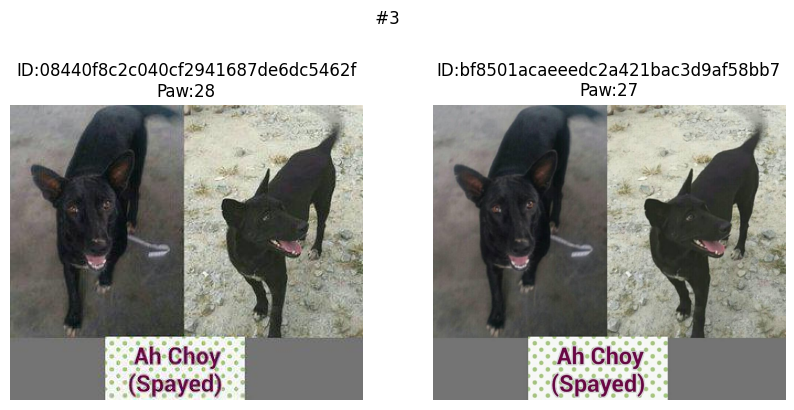

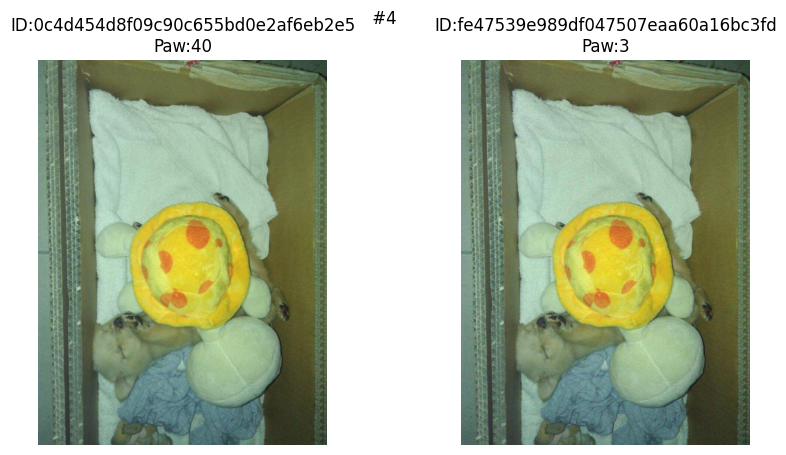

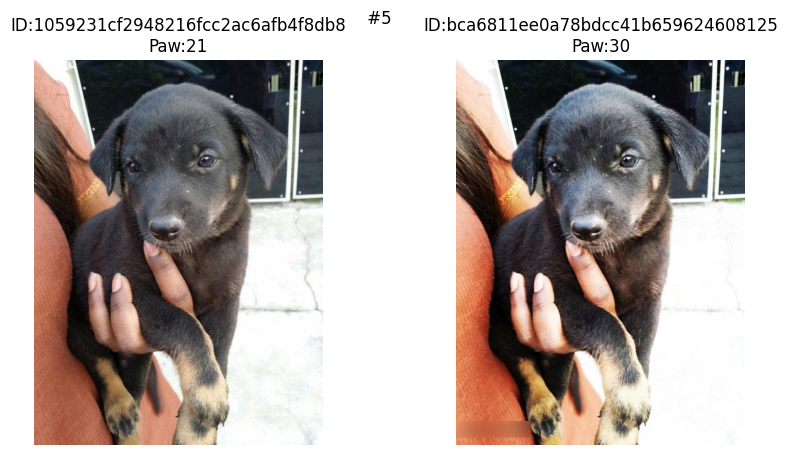

...

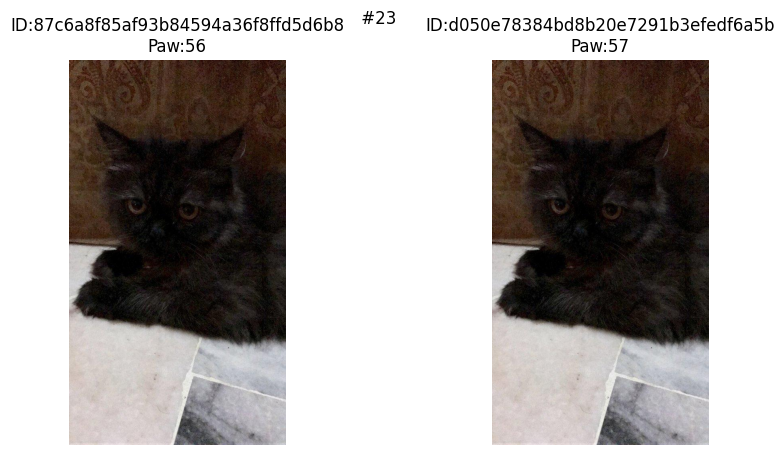

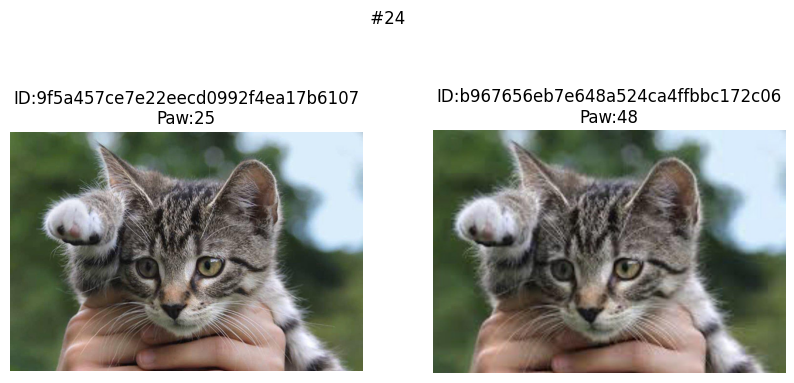

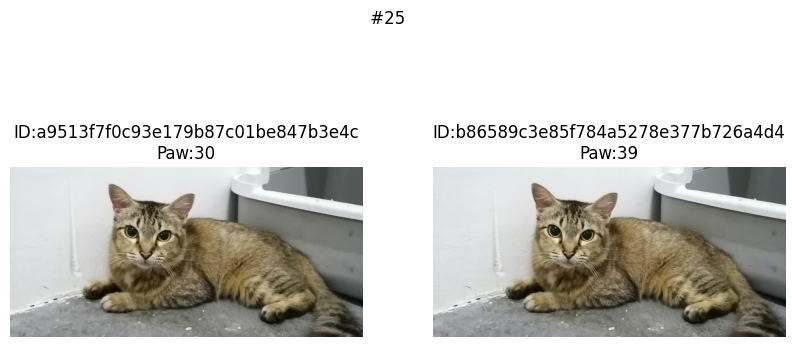

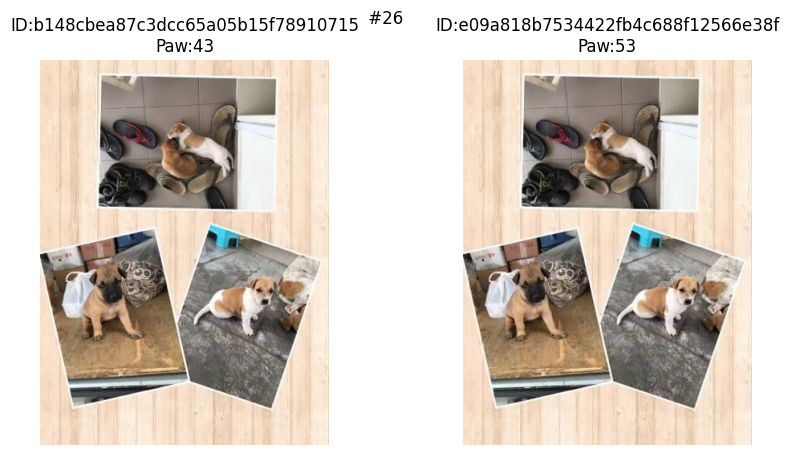

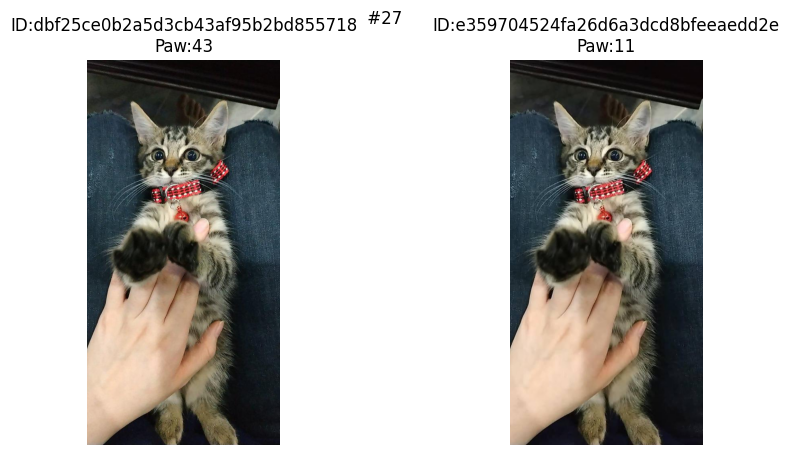

In [6]:
import imagehash
from tqdm.auto import tqdm
from PIL import Image
import matplotlib.pyplot as plt

# Create image paths

df_copy = df.copy()  
df_copy["file_path"] = df_copy["Id"].apply(
    lambda x: os.path.join(IMG_FOLDER, f"{x}.jpg")
)

# Compute perceptual hashes
tqdm.pandas()

def get_hash(file_path):
    img = Image.open(file_path).convert("RGB")
    return imagehash.phash(img)

df_copy["phash"] = df_copy["file_path"].progress_apply(get_hash)

# Find near-duplicate images
duplicate_pairs = []

hashes = df_copy["phash"].tolist()

for i in tqdm(range(len(df_copy)), desc="Comparing images"):
    for j in range(i + 1, len(df_copy)):

        # Hamming distance between pHashes
        dist = hashes[i] - hashes[j]

        # Threshold (4-6 usually works well)
        if dist <= 6:
            duplicate_pairs.append((i, j, dist))

print(f"\nFound {len(duplicate_pairs)} duplicate pairs.\n")

# Display duplicate pairs
for k, (i, j, dist) in enumerate(duplicate_pairs):

    row1 = df_copy.iloc[i]
    row2 = df_copy.iloc[j]

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    ax[0].imshow(Image.open(row1["file_path"]))
    ax[0].set_title(
        
        f"ID:{row1['Id']}\n"
        f"Paw:{row1['Pawpularity']}"
    )
    ax[0].axis("off")

    ax[1].imshow(Image.open(row2["file_path"]))
    ax[1].set_title(
      
        f"ID:{row2['Id']}\n"
        f"Paw:{row2['Pawpularity']}"
    )
    ax[1].axis("off")

    plt.suptitle(
        f" #{k+1}"
    )
    plt.show()